In [1]:
import Pkg
Pkg.activate(".")  
Pkg.add("FFTW")

  Activating project at `C:\Users\USER\Documents\ee4022\julia`
   Resolving package versions...
     Project No packages added to or removed from `C:\Users\USER\Documents\ee4022\julia\Project.toml`
    Manifest No packages added to or removed from `C:\Users\USER\Documents\ee4022\julia\Manifest.toml`


In [2]:
using SerialPorts
using FFTW
using Statistics
using DSP
using Printf
using Plots

In [3]:
list_serialports()

1-element Vector{String}:
 "COM3"

In [4]:
# Constants
const NUM_SAMPLES = 1024
const REF_RESISTANCE = 10306.250  # Ohms
const ADC_VREF = 3.3              # Volts
const ADC_MAX_VALUE = 4095.0      # 12-bit ADC
const NUM_CALIBRATION_SAMPLES = 30

30

In [5]:
const START_MARKER = 0xAA
const END_MARKER = 0x55

0x55

In [6]:
@enum CircuitModel begin
    SERIES_RC = 1
    SERIES_RL = 2
    PARALLEL_RC = 3
    PARALLEL_RL = 4
    CUSTOM = 5
end

In [7]:
mutable struct CircuitConfig
    model::CircuitModel
    frequency::Float64
    # For custom models
    has_series_r::Bool
    has_series_l::Bool
    has_series_c::Bool
    has_parallel_r::Bool
    has_parallel_l::Bool
    has_parallel_c::Bool
end

In [8]:
CircuitConfig() = CircuitConfig(SERIES_RC, 1000.0, true, false, true, false, false, false)

CircuitConfig

In [9]:
mutable struct OnlineStats
    mean::Float64
    M2::Float64
    count::Int64
end

OnlineStats() = OnlineStats(0.0, 0.0, 0)


OnlineStats

In [19]:
# Global statistics variables
impedance_stats = OnlineStats()
phase_stats = OnlineStats()
real_z_stats = OnlineStats()
imag_z_stats = OnlineStats()
v1_stats = OnlineStats()
v2_stats = OnlineStats()
calibration_count = 0
current_circuit = CircuitConfig()

CircuitConfig(SERIES_RC, 1000.0, true, false, true, false, false, false)

In [20]:
function update_stats!(stats::OnlineStats, value::Float64)
    stats.count += 1
    delta = value - stats.mean
    stats.mean += delta / stats.count
    delta2 = value - stats.mean
    stats.M2 += delta * delta2
end


update_stats! (generic function with 1 method)

In [23]:
function std_dev(stats::OnlineStats)
    stats.count < 2 && return 0.0
    return sqrt(stats.M2 / (stats.count - 1))
end

function std_err(stats::OnlineStats)
    stats.count < 2 && return 0.0
    return sqrt(stats.M2 / (stats.count - 1)) / sqrt(Float64(stats.count))
end

std_err (generic function with 1 method)

In [25]:
function prepare_fft_data(adc_data::Vector{UInt16})
    # Convert ADC counts to voltages
    VREF = 3.3
    ADC_MAX = 4095.0
    voltages = VREF * (Float64.(adc_data) ./ ADC_MAX)
    
    # Remove DC offset
    voltages_ac = voltages .- mean(voltages)
    
    # Apply window (e.g., Hann window)
    window = hann(length(voltages_ac))
    windowed_data = voltages_ac .* window
    
    return windowed_data, window
end

prepare_fft_data (generic function with 1 method)

In [27]:

function extract_signal_parameters(fft_complex::Vector{ComplexF64}, bin_index::Int, window::Vector{Float64})
    # Clamp bin index
    bin_index = max(1, min(bin_index + 1, length(fft_complex)))
    component = fft_complex[bin_index]
    real_part, imag_part = real(component), imag(component)

    # Window correction factor
    window_gain = sum(window) / NUM_SAMPLES

    # Calculate amplitude
    magnitude_lsb = (2.0 * abs(component)) / (NUM_SAMPLES * window_gain)
    magnitude_v = magnitude_lsb * (ADC_VREF / ADC_MAX_VALUE)

    # Calculate phase
    phase_rad = atan(imag_part, real_part)

    return magnitude_v, phase_rad
end

extract_signal_parameters (generic function with 1 method)

In [29]:

function compute_fft(data::Vector{Float64})
    # Perform FFT
    fft_result = fft(data)
    return fft_result
end

compute_fft (generic function with 1 method)

In [31]:
function calculate_impedance(mag_v1::Float64, phase_v1::Float64, 
                            mag_v2::Float64, phase_v2::Float64)
    # Voltage ratio
    voltage_ratio = mag_v2 / mag_v1
    
    # Phase difference (V2 - V1)
    phase_diff = phase_v2 - phase_v1
    
    # Normalize phase to [-π, π]
    while phase_diff > π
        phase_diff -= 2π
    end
    while phase_diff < -π
        phase_diff += 2π
    end
    
    # Calculate I and Q components
    I_component = mag_v2 * cos(phase_diff)
    Q_component = mag_v2 * sin(phase_diff)
    
    # Z(ω) = -Ri × (V2/V1)
    impedance_mag = REF_RESISTANCE * voltage_ratio
    
    # Phase (add 180° for the negative sign)
    impedance_phase = phase_diff + π
    
    # Normalize phase
    while impedance_phase > π
        impedance_phase -= 2π
    end
    while impedance_phase < -π
        impedance_phase += 2π
    end
    
    # Convert to rectangular form
    real_z = impedance_mag * cos(impedance_phase)
    imag_z = impedance_mag * sin(impedance_phase)
    
    return impedance_mag, impedance_phase, real_z, imag_z, I_component, Q_component
end

calculate_impedance (generic function with 1 method)

In [33]:
function extract_circuit_parameters(real_z::Float64, imag_z::Float64, frequency::Float64, config::CircuitConfig)
    ω = 2π * frequency
    
    if config.model == SERIES_RC
        Rs = real_z
        Cs = imag_z < 0 ? -1.0 / (ω * imag_z) : 0.0
        return Dict("Rs" => Rs, "Cs" => Cs * 1e6)  # Convert to µF
        
    elseif config.model == SERIES_RL
        Rs = real_z
        Ls = imag_z > 0 ? imag_z / ω : 0.0
        return Dict("Rs" => Rs, "Ls" => Ls * 1e3)  # Convert to mH
        
    elseif config.model == PARALLEL_RC
        # Z = (R * (1/(jωC))) / (R + 1/(jωC))
        # Real and imaginary parts allow solving for R and C
        if abs(real_z) > 1e-6
            G = real_z / (real_z^2 + imag_z^2)  # Conductance
            B = -imag_z / (real_z^2 + imag_z^2)  # Susceptance
            Rp = 1.0 / G
            Cp = B / ω
            return Dict("Rp" => Rp, "Cp" => Cp * 1e6)  # Convert to µF
        end
        
    elseif config.model == PARALLEL_RL
        if abs(real_z) > 1e-6
            G = real_z / (real_z^2 + imag_z^2)
            B = -imag_z / (real_z^2 + imag_z^2)
            Rp = 1.0 / G
            Lp = -1.0 / (ω * B)
            return Dict("Rp" => Rp, "Lp" => Lp * 1e3)  # Convert to mH
        end
        
    elseif config.model == CUSTOM
        # For custom models, return raw impedance components
        result = Dict{String, Float64}()
        if config.has_series_r || config.has_series_l || config.has_series_c
            result["Z_real"] = real_z
            result["Z_imag"] = imag_z
        end
        return result
    end
    
    return Dict{String, Float64}()
end

extract_circuit_parameters (generic function with 1 method)

In [35]:
function display_circuit_parameters(params::Dict{String, Float64})
    println("\n  Circuit Parameters:")
    for (key, value) in params
        if endswith(key, "s") && key != "Rs"
            # Capacitance or Inductance
            if startswith(key, "C")
                println("    $key = $(round(value, digits=3)) µF")
            elseif startswith(key, "L")
                println("    $key = $(round(value, digits=3)) mH")
            end
        elseif endswith(key, "p") && key != "Rp"
            if startswith(key, "C")
                println("    $key = $(round(value, digits=3)) µF")
            elseif startswith(key, "L")
                println("    $key = $(round(value, digits=3)) mH")
            end
        else
            println("    $key = $(round(value, digits=2)) Ω")
        end
    end
end

display_circuit_parameters (generic function with 1 method)

In [37]:
function plot_measurement_analysis(adc1_data::Vector{UInt16}, adc3_data::Vector{UInt16}, 
                                   fft_v1, fft_v2, signal_bin, fsampling,
                                   z_mag, z_phase, real_z, imag_z, freq_out,
                                   measurement_num::Int)
    
    
    # Create time axis
    t = (0:NUM_SAMPLES-1) ./ Float64(fsampling)
    t_ms = t .* 1000  # Convert to milliseconds
    
    # Convert ADC to voltages for plotting
    VREF = 3.3
    ADC_MAX = 4095.0
    adc1_volts = VREF * (Float64.(adc1_data) ./ ADC_MAX)
    adc3_volts = VREF * (Float64.(adc3_data) ./ ADC_MAX)
    
    # Create frequency axis for FFT
    freq_axis = (0:NUM_SAMPLES-1) .* (fsampling / NUM_SAMPLES)
    freq_axis_khz = freq_axis ./ 1000  # Convert to kHz
    
    # Calculate impedance components
    capacitance = -1.0 / (2π * freq_out * imag_z)  # In Farads
    capacitance_nf = capacitance * 1e9  # Convert to nanofarads
    
    # Create a 2x3 subplot layout
    p = plot(layout=(2,3), size=(1800, 1000), plot_title="Measurement #$measurement_num @ $(freq_out) Hz")
    
    # Plot 1: Time domain waveforms
    plot!(p[1], t_ms, adc1_volts, 
          label="V1 (ADC1)", 
          xlabel="Time (ms)", 
          ylabel="Voltage (V)", 
          title="Time Domain Signals",
          linewidth=1.5,
          color=:blue)
    plot!(p[1], t_ms, adc3_volts, 
          label="V2 (ADC3)", 
          linewidth=1.5,
          color=:red)
    
    # Plot 2: FFT Magnitude (full spectrum)
    fft_range = 1:NUM_SAMPLES÷2
    plot!(p[2], freq_axis_khz[fft_range], abs.(fft_v1[fft_range]),
          label="V1 FFT",
          xlabel="Frequency (kHz)",
          ylabel="Magnitude",
          title="FFT Magnitude Spectrum",
          linewidth=1.5,
          yscale=:log10,
          color=:blue)
    plot!(p[2], freq_axis_khz[fft_range], abs.(fft_v2[fft_range]),
          label="V2 FFT",
          linewidth=1.5,
          color=:red)
    # Mark the signal frequency
    vline!(p[2], [freq_out/1000], label="Signal ($(freq_out) Hz)", 
           linestyle=:dash, color=:green, linewidth=2)
    
    # Plot 3: FFT Zoom around signal frequency
    zoom_bins = 20  # Show ±20 bins around signal
    bin_start = max(1, signal_bin - zoom_bins)
    bin_end = min(NUM_SAMPLES÷2, signal_bin + zoom_bins)
    zoom_range = bin_start:bin_end
    
    plot!(p[3], freq_axis[zoom_range], abs.(fft_v1[zoom_range]),
          label="V1 FFT",
          xlabel="Frequency (Hz)",
          ylabel="Magnitude",
          title="FFT Zoom @ Signal Frequency",
          linewidth=2,
          marker=:circle,
          markersize=3,
          color=:blue)
    plot!(p[3], freq_axis[zoom_range], abs.(fft_v2[zoom_range]),
          label="V2 FFT",
          linewidth=2,
          marker=:circle,
          markersize=3,
          color=:red)
    vline!(p[3], [freq_out], label="Signal Bin", 
           linestyle=:dash, color=:green, linewidth=2)
    
    # Plot 4: Impedance Phasor (Complex Plane)
    plot!(p[4], [0, real_z], [0, imag_z],
          arrow=true,
          linewidth=3,
          color=:purple,
          label="Z = $(round(z_mag, digits=1))Ω ∠$(round(rad2deg(z_phase), digits=1))°",
          xlabel="Real (Ω)",
          ylabel="Imaginary (Ω)",
          title="Impedance Phasor",
          aspect_ratio=:equal,
          legend=:topright)
    scatter!(p[4], [real_z], [imag_z], 
            markersize=8, 
            color=:purple,
            label="")
    # Add axes
    hline!(p[4], [0], color=:black, linestyle=:dash, linewidth=0.5, label="")
    vline!(p[4], [0], color=:black, linestyle=:dash, linewidth=0.5, label="")
    # Add annotations
    annotate!(p[4], real_z*0.5, imag_z*0.5, 
             text("R=$(round(real_z, digits=1))Ω\nX=$(round(imag_z, digits=1))Ω", 10))
    
    # Plot 5: RC Circuit Model
    # Show the equivalent series RC circuit
    plot!(p[5], 
          xlims=(0, 10), ylims=(0, 10),
          title="Equivalent Series RC Circuit",
          xlabel="",
          ylabel="",
          showaxis=false,
          grid=false,
          legend=false)
    
    # Draw circuit schematic (simple representation)
    # Resistor
    plot!(p[5], [1, 3], [5, 5], linewidth=3, color=:black)
    annotate!(p[5], 2, 6, text("Rs\n$(round(real_z, digits=1)) Ω", 10, :center))
    
    # Capacitor
    plot!(p[5], [5, 5], [4, 6], linewidth=3, color=:black)
    plot!(p[5], [5.2, 5.2], [4, 6], linewidth=3, color=:black)
    annotate!(p[5], 5.1, 7, text("Cs\n$(round(abs(capacitance_nf), digits=2)) nF", 10, :center))
    
    # Connections
    plot!(p[5], [3, 5], [5, 5], linewidth=2, color=:black)
    plot!(p[5], [5.2, 7], [5, 5], linewidth=2, color=:black)
    plot!(p[5], [0.5, 1], [5, 5], linewidth=2, color=:black)
    plot!(p[5], [7, 9], [5, 5], linewidth=2, color=:black)
    
    # Terminals
    scatter!(p[5], [0.5, 9], [5, 5], markersize=8, color=:red, label="")
    annotate!(p[5], 0.5, 4, text("V1", 10))
    annotate!(p[5], 9, 4, text("V2", 10))
    
    # Add impedance info
    annotate!(p[5], 5, 2, 
             text("@ $(freq_out) Hz\n|Z| = $(round(z_mag, digits=1)) Ω\n∠Z = $(round(rad2deg(z_phase), digits=1))°", 9, :center))
    
    # Plot 6: Impedance Components Bar Chart
    bar!(p[6], ["Resistance\n(R)", "Reactance\n(X)", "Magnitude\n(|Z|)"],
         [abs(real_z), abs(imag_z), z_mag],
         xlabel="Component",
         ylabel="Impedance (Ω)",
         title="Impedance Components",
         legend=false,
         color=[:green, :orange, :purple],
         bar_width=0.6)
    
    # Add value labels on bars
    annotate!(p[6], 1, abs(real_z)*1.05, text("$(round(real_z, digits=1)) Ω", 9))
    annotate!(p[6], 2, abs(imag_z)*1.05, text("$(round(imag_z, digits=1)) Ω", 9))
    annotate!(p[6], 3, z_mag*1.05, text("$(round(z_mag, digits=1)) Ω", 9))
    
    display(p)
    
    # Optionally save the plot
    # savefig(p, "measurement_$(measurement_num)_$(freq_out)Hz.png")
    
    return p
end

plot_measurement_analysis (generic function with 1 method)

In [39]:
function process_measurement(adc1_data::Vector{UInt16}, adc3_data::Vector{UInt16}, 
                            freq_out::UInt32, fsampling::UInt32; 
                            show_plots::Bool=false,
                            measurement_num::Int=0)
    signal_bin = Int(clamp(round((freq_out * NUM_SAMPLES) / fsampling), 1, NUM_SAMPLES÷2))

    println("Processing measurement:")
    println("  Signal frequency: $(freq_out) Hz")
    println("  FFT bin: $(signal_bin)")

    fft_input_v1, window = prepare_fft_data(adc1_data)
    fft_input_v2, _ = prepare_fft_data(adc3_data)

    fft_v1 = compute_fft(fft_input_v1)
    fft_v2 = compute_fft(fft_input_v2)

    mag_v1, phase_v1 = extract_signal_parameters(fft_v1, signal_bin, window)
    mag_v2, phase_v2 = extract_signal_parameters(fft_v2, signal_bin, window)

    z_mag, z_phase, real_z, imag_z, I_comp, Q_comp =
        calculate_impedance(mag_v1, phase_v1, mag_v2, phase_v2)

    global calibration_count
    if calibration_count < NUM_CALIBRATION_SAMPLES
        update_stats!(impedance_stats, z_mag)
        update_stats!(phase_stats, z_phase)
        update_stats!(real_z_stats, real_z)
        update_stats!(imag_z_stats, imag_z)
        update_stats!(v1_stats, mag_v1)
        update_stats!(v2_stats, mag_v2)
        calibration_count += 1
        println("  [$(calibration_count)/$(NUM_CALIBRATION_SAMPLES)] |Z|=$(round(z_mag,digits=3)) Ω (Mean=$(round(impedance_stats.mean,digits=3)), Std=$(round(std_dev(impedance_stats),digits=3)))")
    end

    # Circuit parameter extraction
    circuit_params = extract_circuit_parameters(real_z, imag_z, Float64(freq_out), current_circuit)

    println("  V1: $(round(mag_v1,digits=6)) V @ $(round(rad2deg(phase_v1),digits=2))°")
    println("  V2: $(round(mag_v2,digits=6)) V @ $(round(rad2deg(phase_v2),digits=2))°")
    println("  |Z|: $(round(z_mag,digits=3)) Ω, ∠Z: $(round(rad2deg(z_phase),digits=2))°")
    println("  Z = $(round(real_z,digits=3)) + $(round(imag_z,digits=3))j Ω")

    display_circuit_parameters(circuit_params)

    # Generate comprehensive plots if requested
    if show_plots
        plot_measurement_analysis(adc1_data, adc3_data, fft_v1, fft_v2, 
                                 signal_bin, fsampling, z_mag, z_phase, 
                                 real_z, imag_z, freq_out, measurement_num)
    end

    return z_mag, z_phase, real_z, imag_z, mag_v1, mag_v2, circuit_params
end

process_measurement (generic function with 1 method)

In [41]:
function print_final_statistics()
    println("\n" * "="^80)
    println("                    CALIBRATION COMPLETE")
    println("Samples Collected: $(impedance_stats.count)")
    println("-"^80)
    
    println("\nImpedance Magnitude:")
    println("  Mean:    $(impedance_stats.mean) Ohms")
    println("  Std Dev: $(std_dev(impedance_stats)) Ohms")
    println("  StdErr:  $(std_err(impedance_stats)) Ohms")
    println("  CV:      $((std_dev(impedance_stats) / impedance_stats.mean) * 100)%")
    
    println("\nPhase:")
    println("  Mean:    $(rad2deg(phase_stats.mean)) degrees")
    println("  Std Dev: $(rad2deg(std_dev(phase_stats))) degrees")
    
    println("\nAveraged Impedance:")
    println("  Z̄ = $(real_z_stats.mean) + $(imag_z_stats.mean)j Ohms")
    println("="^80 * "\n")
end

print_final_statistics (generic function with 1 method)

In [43]:


function select_circuit_model()
    println("\n" * "="^60)
    println("SELECT CIRCUIT MODEL")
    println("="^60)
    println("1. Series RC (Rs + Cs)")
    println("2. Series RL (Rs + Ls)")
    println("3. Parallel RC (Rp || Cp)")
    println("4. Parallel RL (Rp || Lp)")
    println("5. Custom (specify components)")
    println("="^60)
    print("Enter choice (1-5): ")
    
    choice = parse(Int, readline())
    
    if choice == 1
        current_circuit.model = SERIES_RC
        println("Selected: Series RC model")
    elseif choice == 2
        current_circuit.model = SERIES_RL
        println("Selected: Series RL model")
    elseif choice == 3
        current_circuit.model = PARALLEL_RC
        println("Selected: Parallel RC model")
    elseif choice == 4
        current_circuit.model = PARALLEL_RL
        println("Selected: Parallel RL model")
    elseif choice == 5
        configure_custom_model()
    else
        println("Invalid choice, defaulting to Series RC")
        current_circuit.model = SERIES_RC
    end
    
    print("Enter test frequency (Hz): ")
    freq = parse(Float64, readline())
    current_circuit.frequency = freq
    
    println("\nConfiguration complete!")
    println("Model: $(current_circuit.model)")
    println("Frequency: $(current_circuit.frequency) Hz\n")
end



select_circuit_model (generic function with 1 method)

In [45]:
function configure_custom_model()
    current_circuit.model = CUSTOM
    println("\nConfigure custom circuit model:")
    print("Include series resistance? (y/n): ")
    current_circuit.has_series_r = lowercase(strip(readline())) == "y"
    print("Include series inductance? (y/n): ")
    current_circuit.has_series_l = lowercase(strip(readline())) == "y"
    
    print("Include series capacitance? (y/n): ")
    current_circuit.has_series_c = lowercase(strip(readline())) == "y"
    
    print("Include parallel resistance? (y/n): ")
    current_circuit.has_parallel_r = lowercase(strip(readline())) == "y"
    
    print("Include parallel inductance? (y/n): ")
    current_circuit.has_parallel_l = lowercase(strip(readline())) == "y"
    print("Include parallel capacitance? (y/n): ")
    current_circuit.has_parallel_c = lowercase(strip(readline())) == "y"
end

# Serial port functions would go here
# (Keeping the corrected versions from previous response)

println("Impedance Analyzer - Julia DSP Processing")
println("==========================================\n")

select_circuit_model()

Impedance Analyzer - Julia DSP Processing


SELECT CIRCUIT MODEL
1. Series RC (Rs + Cs)
2. Series RL (Rs + Ls)
3. Parallel RC (Rp || Cp)
4. Parallel RL (Rp || Lp)
5. Custom (specify components)
Enter choice (1-5): 

stdin>  3


Selected: Parallel RC model
Enter test frequency (Hz): 

stdin>  100



Configuration complete!
Model: PARALLEL_RC
Frequency: 100.0 Hz



In [47]:
function receive_data_from_stm32(port)
    # Wait for data to be available
    timeout = 10.0  # 10 second timeout
    start_time = time()
    
    expected_bytes = 4106  # 1 start + 4 freq + 4 fs + 2048 ADC1 + 2048 ADC3 + 1 end
    
    while bytesavailable(port) < expected_bytes
        if (time() - start_time) > timeout
            error("Timeout waiting for data from STM32 (got $(bytesavailable(port)) bytes, expected $expected_bytes)")
        end
        sleep(0.01)
    end
    
    # Read all available data
    raw = readavailable(port)
    println("Received $(length(raw)) bytes")
    
    # Convert to Vector{UInt8} if needed
    raw = Vector{UInt8}(raw)
    
    # Verify markers
    if raw[1] != 0xAA
        @warn @sprintf(" Start marker missing or incorrect: 0x%02X", raw[1])
    end
    if raw[end] != 0x55
        @warn @sprintf(" End marker missing or incorrect: 0x%02X", raw[end])
    end
    
    # Parse metadata
    freq_out = reinterpret(UInt32, raw[2:5])[1]
    fsampling = reinterpret(UInt32, raw[6:9])[1]
    @printf("freq_out = %d Hz, fsampling = %d Hz\n", freq_out, fsampling)
    
    # Extract ADC buffers
    num_samples = 1024
    adc1_bytes = raw[10 : 10 + num_samples*2 - 1]
    adc3_bytes = raw[10 + num_samples*2 : 10 + num_samples*4 - 1]
    
    adc1_data = Vector{UInt16}(reinterpret(UInt16, adc1_bytes))
    adc3_data = Vector{UInt16}(reinterpret(UInt16, adc3_bytes))
    
    
    # Convert to voltages for display only
    VREF = 3.3
    ADC_MAX = 4095.0
    adc1_volts = VREF * (Float64.(adc1_data) ./ ADC_MAX)
    adc3_volts = VREF * (Float64.(adc3_data) ./ ADC_MAX)
    
    println(" Parsed $(length(adc1_data)) samples per channel.")
    println("First 10 ADC1 samples (V): ", round.(adc1_volts[1:10], digits=4))
    println("First 10 ADC3 samples (V): ", round.(adc3_volts[1:10], digits=4))
    
    # Return raw UInt16 data for process_measurement
    return adc1_data, adc3_data, freq_out, fsampling
end

receive_data_from_stm32 (generic function with 1 method)

In [49]:
function send_results_to_stm32(port, z_mag::Float64, z_phase::Float64, 
                               real_z::Float64, imag_z::Float64,
                               mag_v1::Float64, mag_v2::Float64, stderr::Float64)
    # Send start marker
    write(port, START_MARKER)
    
    # Send results as Float32 (7 floats * 4 bytes = 28 bytes)
    result_data = Float32[z_mag, z_phase, real_z, imag_z, mag_v1, mag_v2, stderr]
    write(port, reinterpret(UInt8, result_data))
    
    # Send end marker
    write(port, END_MARKER)
    
    flush(port)  # Ensure data is sent
end

send_results_to_stm32 (generic function with 1 method)

In [51]:
function main(max_measurements=nothing)
    port_name = "COM3"
    println("Opening serial port: $(port_name)")
    
    port = SerialPort(port_name, 115200)
    measurement_count = 0
    
    try
        # Wait for port to stabilize
        sleep(10)
        
        # Flush any garbage in the buffer
        println("Flushing serial buffer...")
        while bytesavailable(port) > 0
            read(port, bytesavailable(port))
        end
        sleep(40)
        
        println("\nWaiting for measurements from STM32...")
        println("Press Ctrl+C to stop\n")
        
        while true
            try
                # Receive data from STM32
                adc1_data, adc3_data, freq_out, fsampling = receive_data_from_stm32(port)
                
                # Process the measurement
                z_mag, z_phase, real_z, imag_z, mag_v1, mag_v2, _ = 
                    process_measurement(adc1_data, adc3_data, freq_out, fsampling, 
                       show_plots=true,  # Enable plots
                       measurement_num=measurement_count+1)
                
                # Get current standard error
                stderr_val = std_err(impedance_stats)
                
                # Send results back to STM32
                send_results_to_stm32(port, z_mag, z_phase, real_z, imag_z, 
                                     mag_v1, mag_v2, stderr_val)
                
                measurement_count += 1
                println("Results sent to STM32 [Measurement #$(measurement_count)]\n")
                
                # Stop after max_measurements if specified
                if max_measurements !== nothing && measurement_count >= max_measurements
                    println("\nCompleted $(max_measurements) measurements")
                    break
                end
                
            catch e
                if isa(e, EOFError) || isa(e, Base.IOError)
                    println("Connection lost, waiting for reconnection...")
                    sleep(1)
                elseif isa(e, InterruptException)
                    println("\nInterrupted by user")
                    break
                else
                    println(" Error: ", e)
                    # Print stack trace for debugging
                    for (exc, bt) in Base.catch_stack()
                        showerror(stdout, exc, bt)
                        println()
                    end
                    break
                end
            end
        end
    finally
        close(port)
        println("Serial port closed")
    end
end

main (generic function with 2 methods)

Opening serial port: COM3
Flushing serial buffer...

Waiting for measurements from STM32...
Press Ctrl+C to stop

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.3594, 0.3578, 0.3578, 0.3562, 0.3514, 0.3481, 0.3368, 0.3473, 0.3473, 0.336]
First 10 ADC3 samples (V): [2.0541, 2.0533, 2.0558, 2.0549, 2.0582, 2.0574, 2.0606, 2.063, 2.0614, 2.063]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [1/30] |Z|=3450.082 Ω (Mean=3450.082, Std=0.0)
  V1: 0.001086 V @ 172.69°
  V2: 0.000364 V @ -19.52°
  |Z|: 3450.082 Ω, ∠Z: -12.21°
  Z = 3372.053 + -729.604j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3529.92 Ω


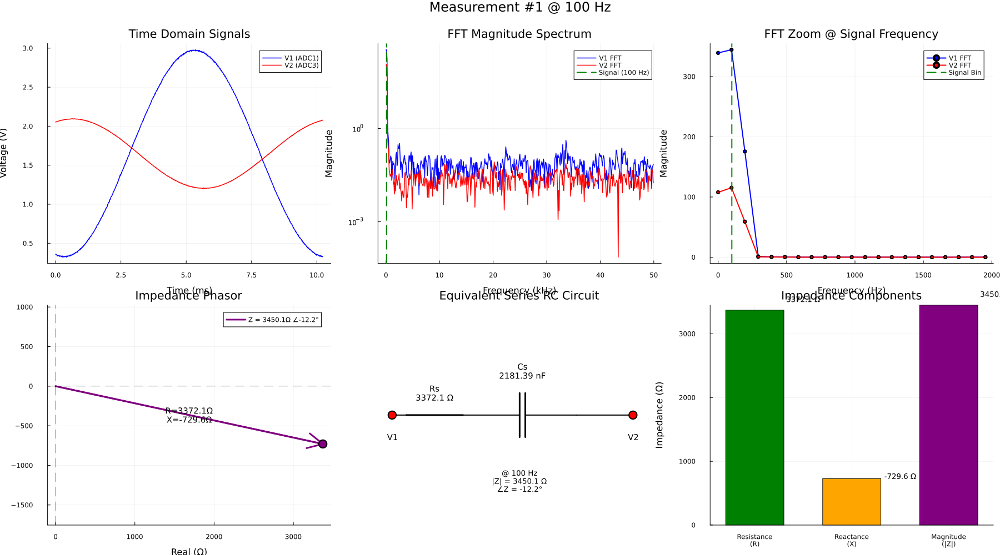

Results sent to STM32 [Measurement #1]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.9712, 2.9841, 2.9599, 2.9752, 2.976, 2.9744, 2.9785, 2.9728, 2.976, 2.9664]
First 10 ADC3 samples (V): [2.0759, 1.2209, 1.216, 1.2185, 1.2177, 1.2168, 1.2152, 1.212, 1.212, 1.2144]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [2/30] |Z|=3445.272 Ω (Mean=3447.677, Std=3.401)
  V1: 0.001086 V @ 2.27°
  V2: 0.000363 V @ 170.03°
  |Z|: 3445.272 Ω, ∠Z: -12.24°
  Z = 3366.948 + -730.452j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3525.42 Ω


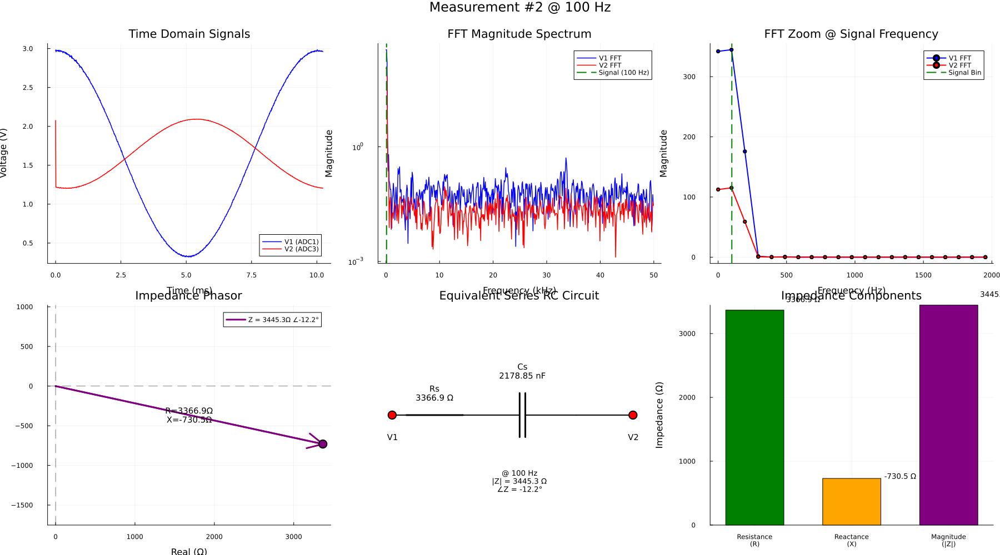

Results sent to STM32 [Measurement #2]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.5947, 0.5947, 0.6052, 0.6084, 0.6076, 0.6149, 0.627, 0.6165, 0.6262, 0.6407]
First 10 ADC3 samples (V): [1.2064, 2.0525, 2.0501, 2.0493, 2.0461, 2.0509, 2.0453, 2.0421, 2.0412, 2.0396]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [3/30] |Z|=3459.537 Ω (Mean=3451.63, Std=7.258)
  V1: 0.001079 V @ -139.3°
  V2: 0.000362 V @ 28.45°
  |Z|: 3459.537 Ω, ∠Z: -12.25°
  Z = 3380.814 + -733.823j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3540.09 Ω


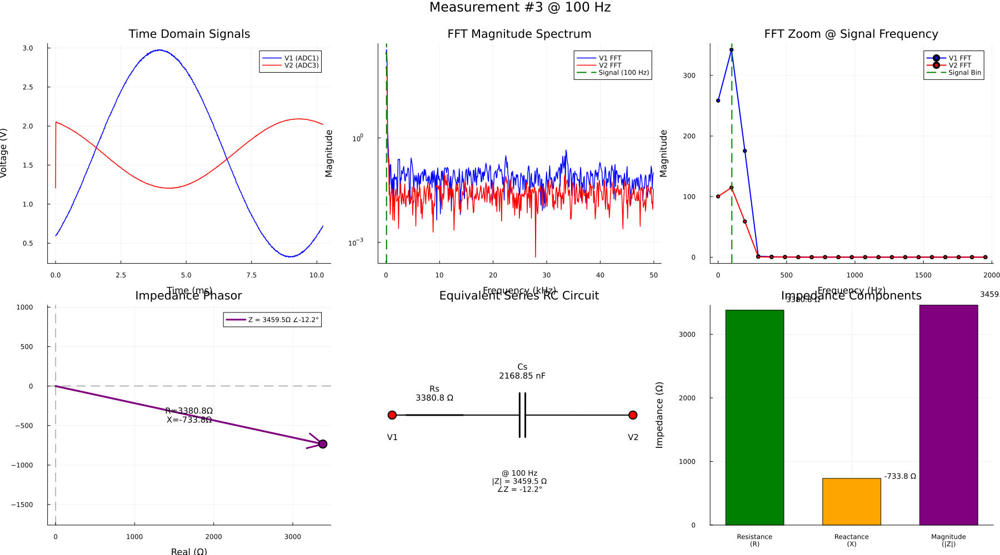

Results sent to STM32 [Measurement #3]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.8462, 1.8358, 1.8349, 1.8212, 1.814, 1.8059, 1.7979, 1.7955, 1.7769, 1.7737]
First 10 ADC3 samples (V): [2.0195, 1.4957, 1.4965, 1.4997, 1.5021, 1.5078, 1.5086, 1.5102, 1.5134, 1.5174]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [4/30] |Z|=3458.42 Ω (Mean=3453.328, Std=6.83)
  V1: 0.001069 V @ 85.74°
  V2: 0.000359 V @ -106.78°
  |Z|: 3458.42 Ω, ∠Z: -12.52°
  Z = 3376.213 + -749.569j Ω

  Circuit Parameters:
    Cp = 0.1 µF
    Rp = 3542.63 Ω


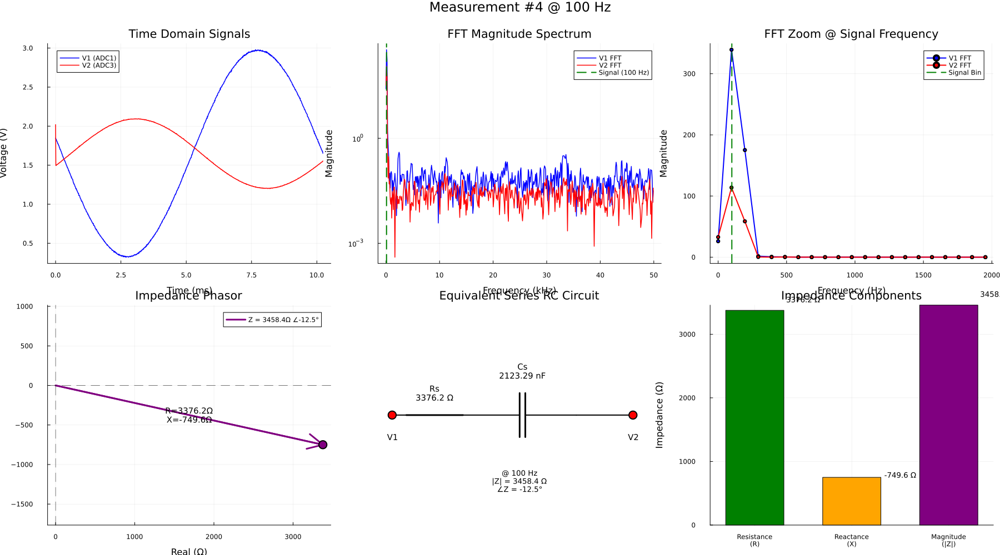

Results sent to STM32 [Measurement #4]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.6625, 1.6738, 1.6859, 1.6891, 1.6875, 1.702, 1.7213, 1.7221, 1.7374, 1.7439]
First 10 ADC3 samples (V): [1.5545, 1.7382, 1.7342, 1.7334, 1.7278, 1.7253, 1.7229, 1.7197, 1.7165, 1.7149]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [5/30] |Z|=3454.792 Ω (Mean=3453.621, Std=5.951)
  V1: 0.001069 V @ -85.12°
  V2: 0.000358 V @ 82.33°
  |Z|: 3454.792 Ω, ∠Z: -12.56°
  Z = 3372.169 + -751.043j Ω

  Circuit Parameters:
    Cp = 0.1 µF
    Rp = 3539.44 Ω


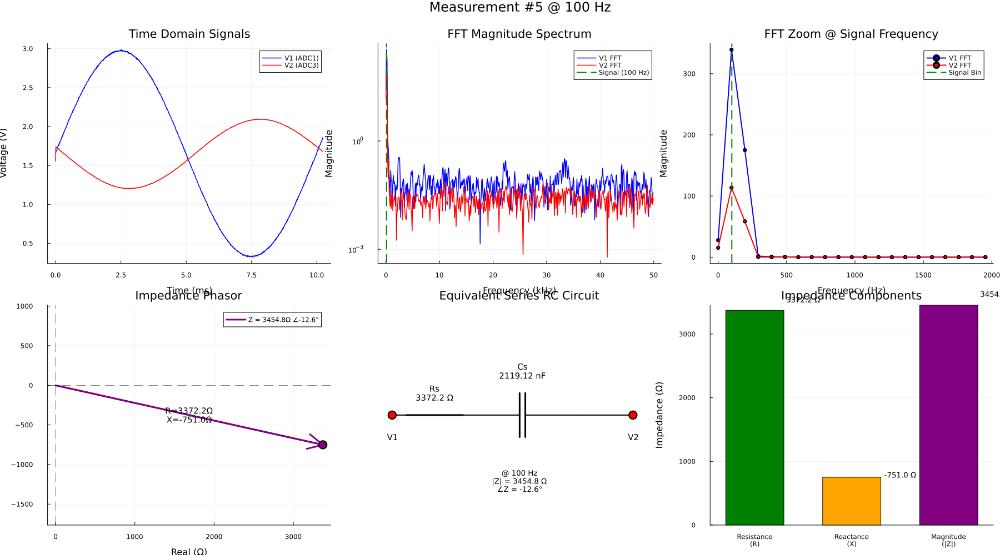

Results sent to STM32 [Measurement #5]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.992, 0.9928, 0.9832, 0.9686, 0.9566, 0.9582, 0.9493, 0.9364, 0.9292, 0.9195]
First 10 ADC3 samples (V): [1.6762, 1.7874, 1.7874, 1.789, 1.793, 1.7979, 1.7963, 1.7987, 1.8011, 1.8059]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [6/30] |Z|=3446.235 Ω (Mean=3452.39, Std=6.117)
  V1: 0.001075 V @ 124.76°
  V2: 0.000359 V @ -67.73°
  |Z|: 3446.235 Ω, ∠Z: -12.48°
  Z = 3364.745 + -745.001j Ω

  Circuit Parameters:
    Cp = 0.1 µF
    Rp = 3529.7 Ω


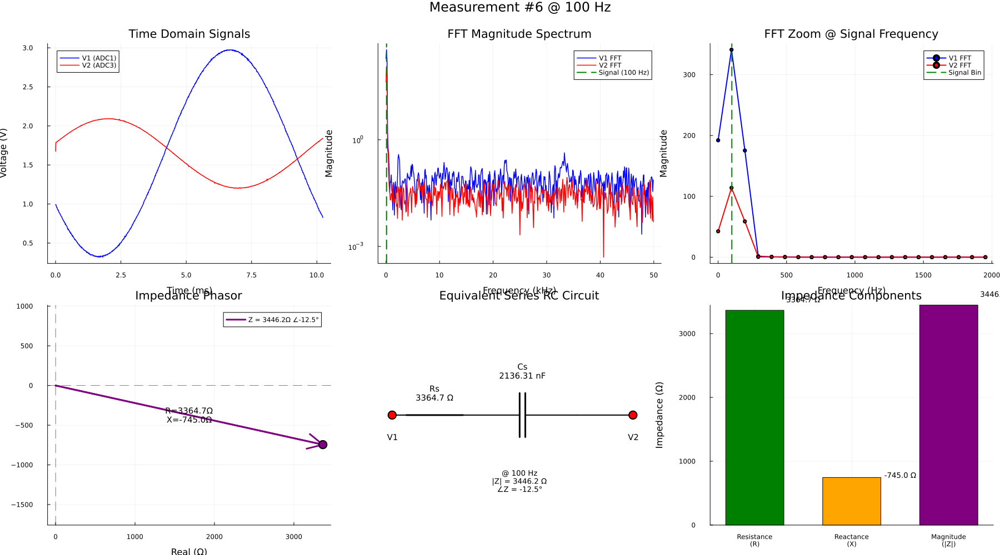

Results sent to STM32 [Measurement #6]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.6747, 2.6763, 2.6763, 2.6956, 2.6972, 2.6924, 2.7061, 2.7029, 2.7101, 2.723]
First 10 ADC3 samples (V): [1.8446, 1.3724, 1.3724, 1.3684, 1.3684, 1.3627, 1.3684, 1.3611, 1.3571, 1.3595]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [7/30] |Z|=3438.85 Ω (Mean=3450.455, Std=7.574)
  V1: 0.001081 V @ -34.73°
  V2: 0.000361 V @ 132.86°
  |Z|: 3438.85 Ω, ∠Z: -12.42°
  Z = 3358.399 + -739.49j Ω

  Circuit Parameters:
    Cp = 0.1 µF
    Rp = 3521.23 Ω


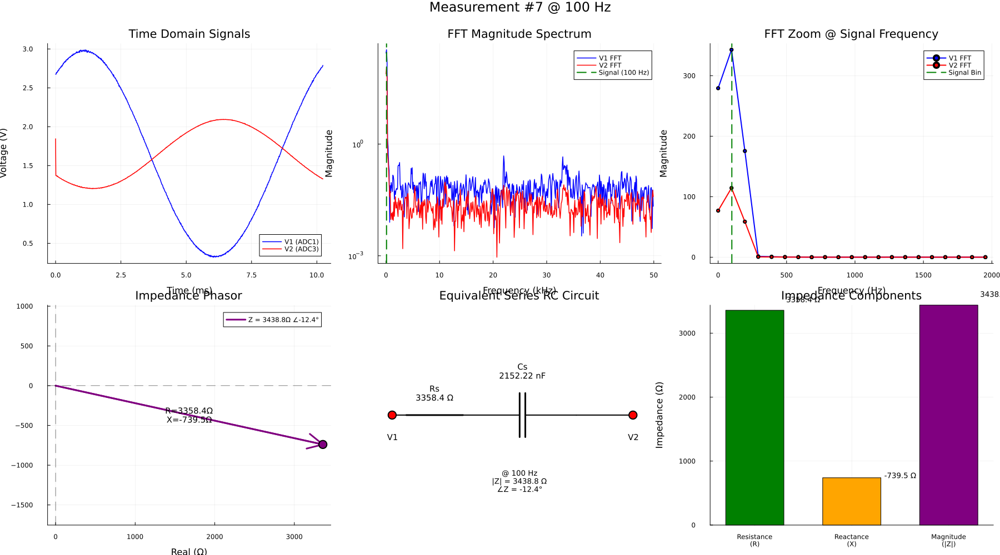

Results sent to STM32 [Measurement #7]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.361, 0.3554, 0.361, 0.3586, 0.357, 0.3481, 0.3489, 0.3465, 0.3546, 0.3457]
First 10 ADC3 samples (V): [1.3232, 2.0429, 2.0477, 2.0493, 2.0509, 2.0525, 2.0558, 2.0574, 2.0582, 2.0582]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [8/30] |Z|=3439.833 Ω (Mean=3449.128, Std=7.955)
  V1: 0.001086 V @ 170.91°
  V2: 0.000363 V @ -21.33°
  |Z|: 3439.833 Ω, ∠Z: -12.24°
  Z = 3361.697 + -729.002j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3519.78 Ω


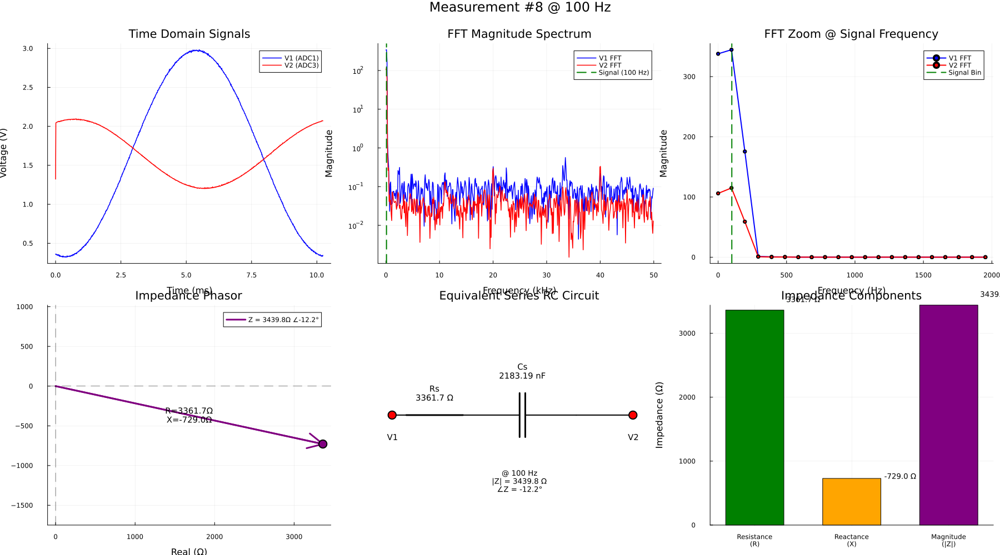

Results sent to STM32 [Measurement #8]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.9615, 2.9567, 2.9551, 2.964, 2.9543, 2.9478, 2.9551, 2.943, 2.9519, 2.9446]
First 10 ADC3 samples (V): [2.0719, 1.2072, 1.2056, 1.2072, 1.204, 1.204, 1.2056, 1.2064, 1.208, 1.2056]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [9/30] |Z|=3448.477 Ω (Mean=3449.055, Std=7.444)
  V1: 0.001086 V @ 12.52°
  V2: 0.000363 V @ -179.69°
  |Z|: 3448.477 Ω, ∠Z: -12.22°
  Z = 3370.395 + -729.681j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3528.37 Ω


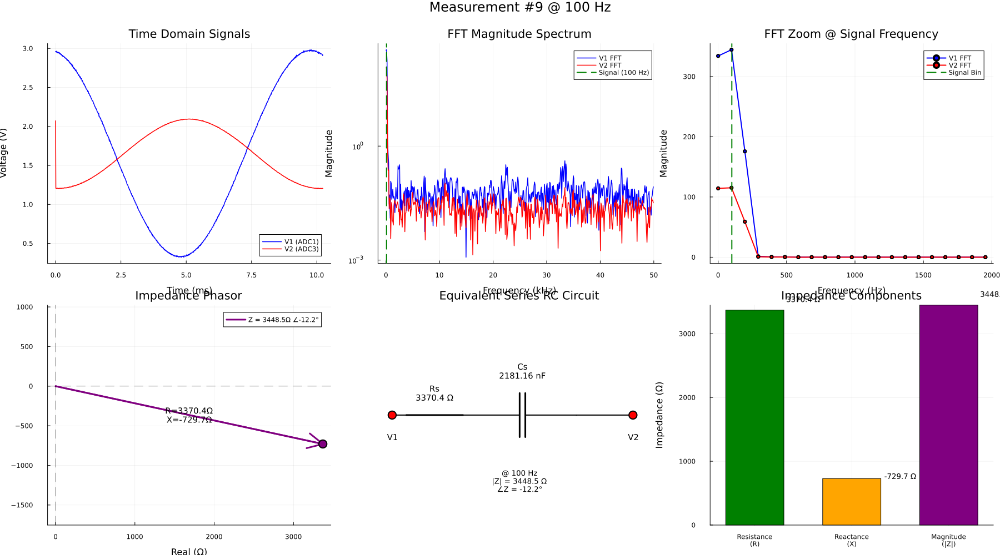

Results sent to STM32 [Measurement #9]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.5101, 0.5053, 0.5085, 0.5158, 0.5335, 0.5319, 0.5359, 0.5432, 0.5432, 0.548]
First 10 ADC3 samples (V): [1.2064, 2.0719, 2.0735, 2.0703, 2.0678, 2.0686, 2.0686, 2.067, 2.0646, 2.063]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [10/30] |Z|=3459.083 Ω (Mean=3450.058, Std=7.702)
  V1: 0.001081 V @ -146.13°
  V2: 0.000363 V @ 21.65°
  |Z|: 3459.083 Ω, ∠Z: -12.22°
  Z = 3380.717 + -732.127j Ω

  Circuit Parameters:
    Cp = 0.097 µF
    Rp = 3539.27 Ω


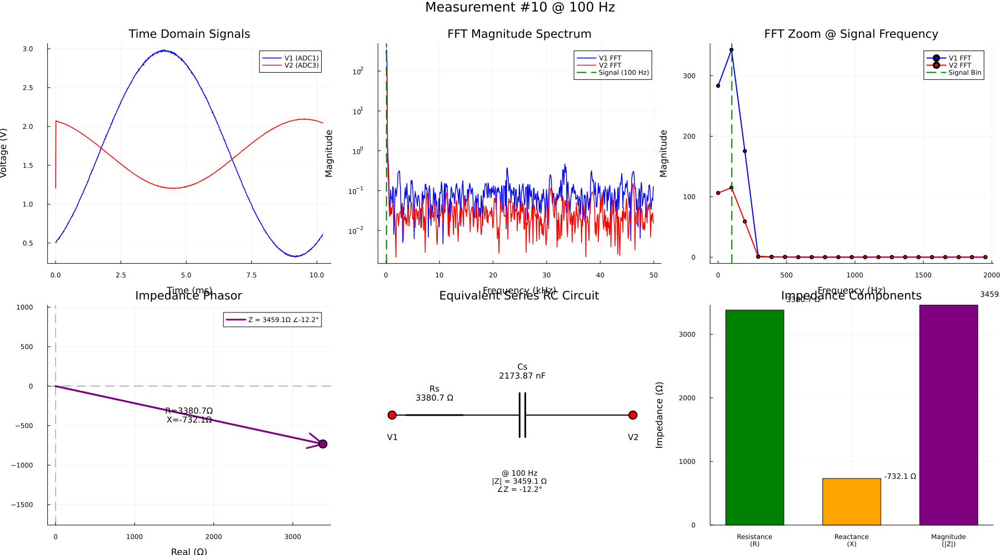

Results sent to STM32 [Measurement #10]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.4385, 2.4313, 2.4216, 2.4224, 2.4031, 2.3894, 2.3942, 2.3853, 2.3797, 2.3757]
First 10 ADC3 samples (V): [2.0493, 1.3192, 1.3208, 1.32, 1.3224, 1.3289, 1.3305, 1.3305, 1.3321, 1.3369]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [11/30] |Z|=3461.227 Ω (Mean=3451.073, Std=8.045)
  V1: 0.001074 V @ 57.64°
  V2: 0.000361 V @ -134.73°
  |Z|: 3461.227 Ω, ∠Z: -12.37°
  Z = 3380.88 + -741.446j Ω

  Circuit Parameters:
    Cp = 0.099 µF
    Rp = 3543.48 Ω


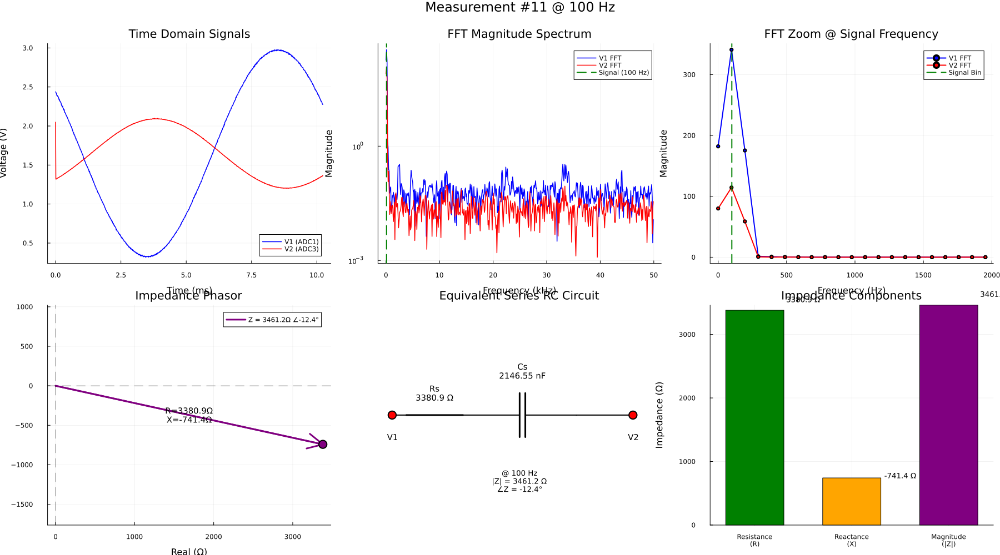

Results sent to STM32 [Measurement #11]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.1016, 1.1064, 1.1218, 1.125, 1.1274, 1.1379, 1.1427, 1.1508, 1.1621, 1.1612]
First 10 ADC3 samples (V): [1.3643, 1.9147, 1.9099, 1.9123, 1.9067, 1.9034, 1.901, 1.9018, 1.8986, 1.8962]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [12/30] |Z|=3461.404 Ω (Mean=3451.934, Std=8.23)
  V1: 0.001071 V @ -110.74°
  V2: 0.00036 V @ 56.85°
  |Z|: 3461.404 Ω, ∠Z: -12.41°
  Z = 3380.469 + -744.141j Ω

  Circuit Parameters:
    Cp = 0.099 µF
    Rp = 3544.28 Ω


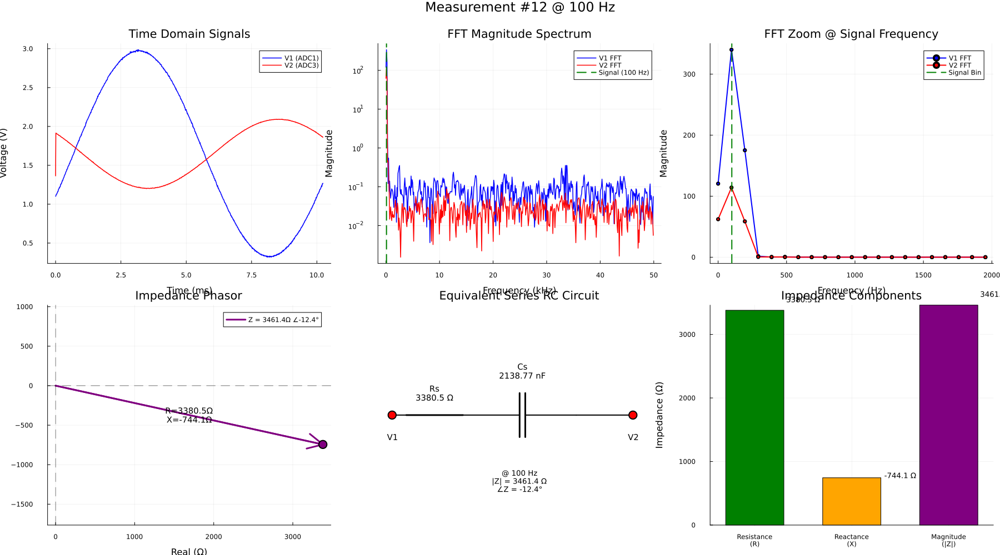

Results sent to STM32 [Measurement #12]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.8261, 1.8124, 1.8011, 1.7979, 1.7866, 1.7858, 1.7705, 1.7536, 1.7527, 1.7479]
First 10 ADC3 samples (V): [1.8607, 1.5062, 1.5086, 1.5094, 1.5118, 1.5255, 1.5166, 1.519, 1.5247, 1.5263]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [13/30] |Z|=3457.537 Ω (Mean=3452.365, Std=8.031)
  V1: 0.001069 V @ 87.13°
  V2: 0.000359 V @ -105.26°
  |Z|: 3457.537 Ω, ∠Z: -12.38°
  Z = 3377.082 + -741.535j Ω

  Circuit Parameters:
    Cp = 0.099 µF
    Rp = 3539.91 Ω


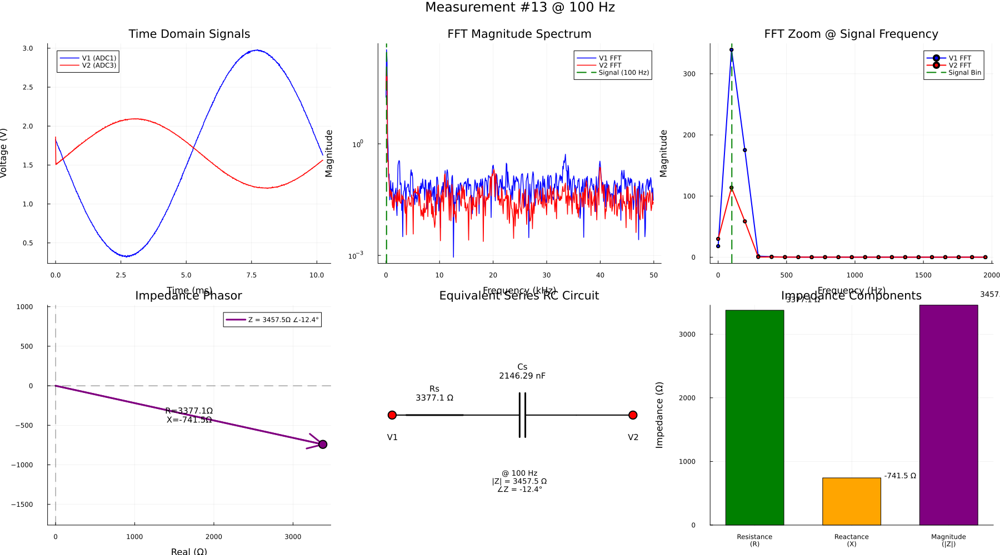

Results sent to STM32 [Measurement #13]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.2612, 2.2749, 2.2886, 2.283, 2.2838, 2.3104, 2.3177, 2.3305, 2.3249, 2.3314]
First 10 ADC3 samples (V): [1.5666, 1.5319, 1.5263, 1.5239, 1.5207, 1.5215, 1.515, 1.5094, 1.5102, 1.5078]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [14/30] |Z|=3444.568 Ω (Mean=3451.808, Std=7.993)
  V1: 0.001074 V @ -57.46°
  V2: 0.000359 V @ 110.06°
  |Z|: 3444.568 Ω, ∠Z: -12.48°
  Z = 3363.115 + -744.649j Ω

  Circuit Parameters:
    Cp = 0.1 µF
    Rp = 3527.99 Ω


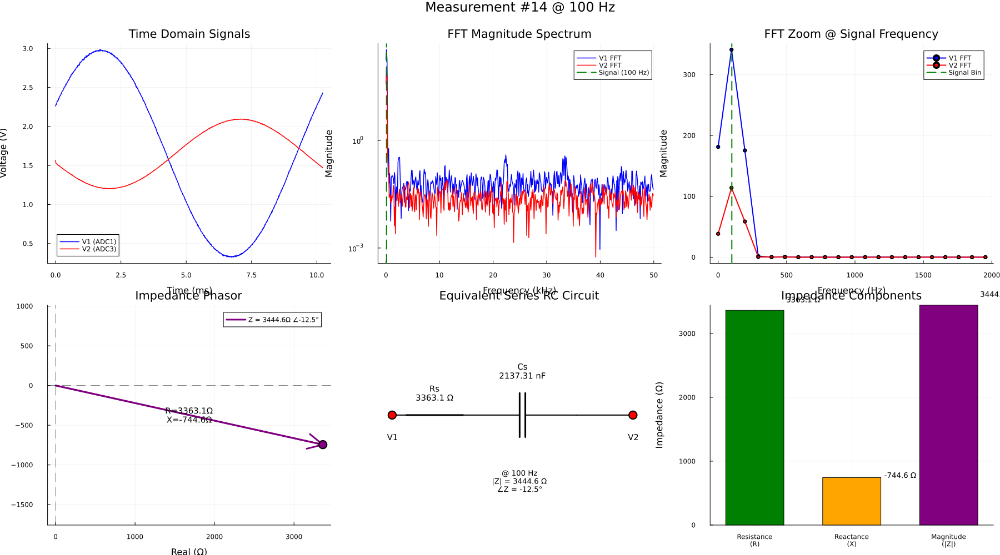

Results sent to STM32 [Measurement #14]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.6576, 0.6503, 0.6527, 0.6431, 0.635, 0.639, 0.6278, 0.6262, 0.6141, 0.61]
First 10 ADC3 samples (V): [1.4683, 1.9123, 1.9171, 1.9155, 1.9188, 1.9196, 1.9212, 1.9236, 1.926, 1.9284]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [15/30] |Z|=3440.266 Ω (Mean=3451.039, Std=8.259)
  V1: 0.001081 V @ 143.1°
  V2: 0.000361 V @ -49.31°
  |Z|: 3440.266 Ω, ∠Z: -12.41°
  Z = 3359.852 + -739.474j Ω

  Circuit Parameters:
    Cp = 0.099 µF
    Rp = 3522.6 Ω


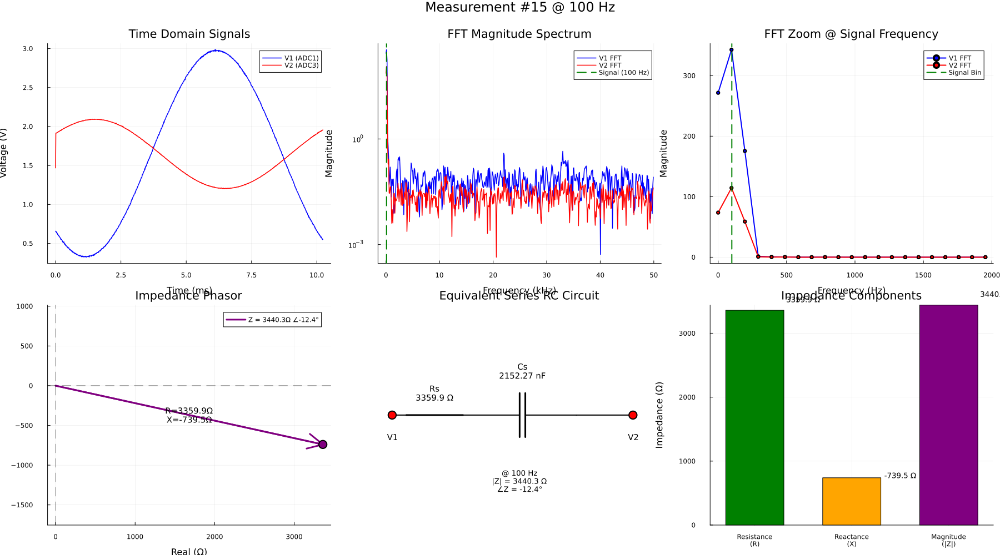

Results sent to STM32 [Measurement #15]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.9422, 2.9325, 2.9406, 2.9406, 2.9495, 2.9503, 2.9486, 2.9486, 2.9478, 2.9551]
First 10 ADC3 samples (V): [1.9582, 1.2491, 1.2491, 1.2491, 1.2475, 1.2475, 1.2426, 1.2451, 1.2386, 1.2394]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [16/30] |Z|=3444.356 Ω (Mean=3450.621, Std=8.152)
  V1: 0.001086 V @ -9.14°
  V2: 0.000363 V @ 158.64°
  |Z|: 3444.356 Ω, ∠Z: -12.23°
  Z = 3366.224 + -729.466j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3524.3 Ω


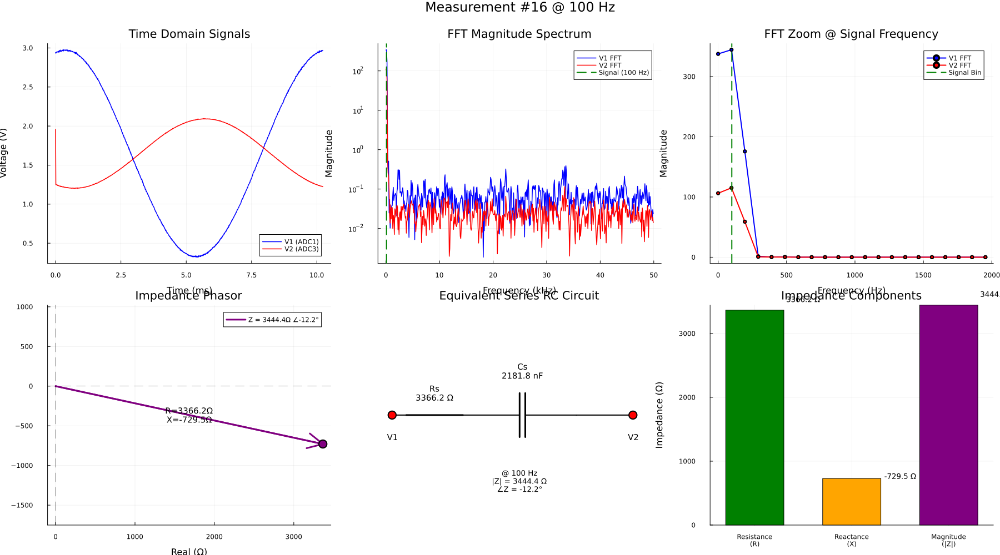

Results sent to STM32 [Measurement #16]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [0.3755, 0.3659, 0.3723, 0.3884, 0.3788, 0.3779, 0.39, 0.3965, 0.3965, 0.3868]
First 10 ADC3 samples (V): [1.2225, 2.0944, 2.092, 2.0993, 2.0912, 2.092, 2.092, 2.0936, 2.1041, 2.092]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [17/30] |Z|=3441.737 Ω (Mean=3450.098, Std=8.182)
  V1: 0.001086 V @ -161.16°
  V2: 0.000363 V @ 6.76°
  |Z|: 3441.737 Ω, ∠Z: -12.08°
  Z = 3365.548 + -720.166j Ω

  Circuit Parameters:
    Cp = 0.097 µF
    Rp = 3519.65 Ω


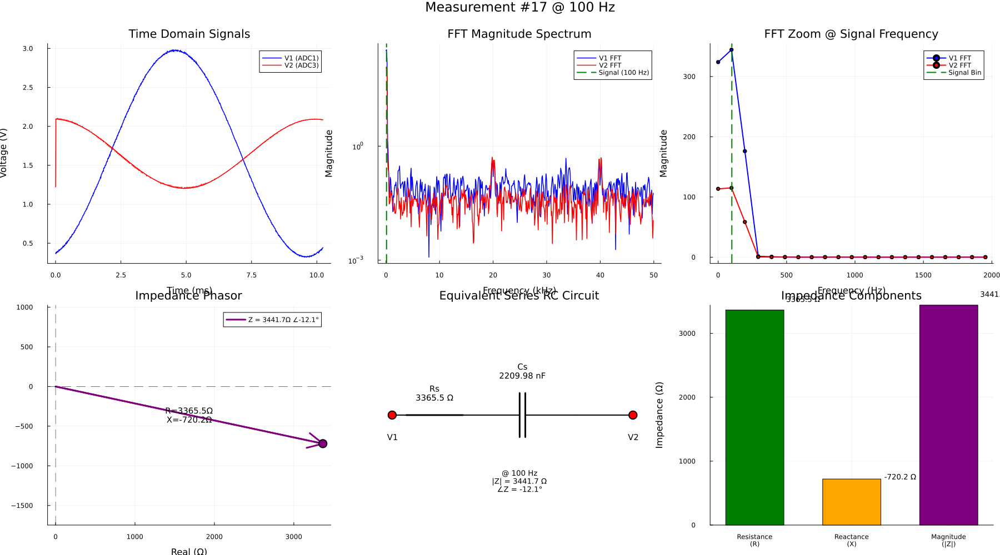

Results sent to STM32 [Measurement #17]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [2.5836, 2.5763, 2.5642, 2.5618, 2.5497, 2.5449, 2.5344, 2.5223, 2.5143, 2.5191]
First 10 ADC3 samples (V): [2.0832, 1.2837, 1.2837, 1.2862, 1.2853, 1.287, 1.2878, 1.2918, 1.2934, 1.295]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [18/30] |Z|=3462.018 Ω (Mean=3450.761, Std=8.42)
  V1: 0.001076 V @ 49.66°
  V2: 0.000362 V @ -142.64°
  |Z|: 3462.018 Ω, ∠Z: -12.31°
  Z = 3382.463 + -737.911j Ω

  Circuit Parameters:
    Cp = 0.098 µF
    Rp = 3543.44 Ω


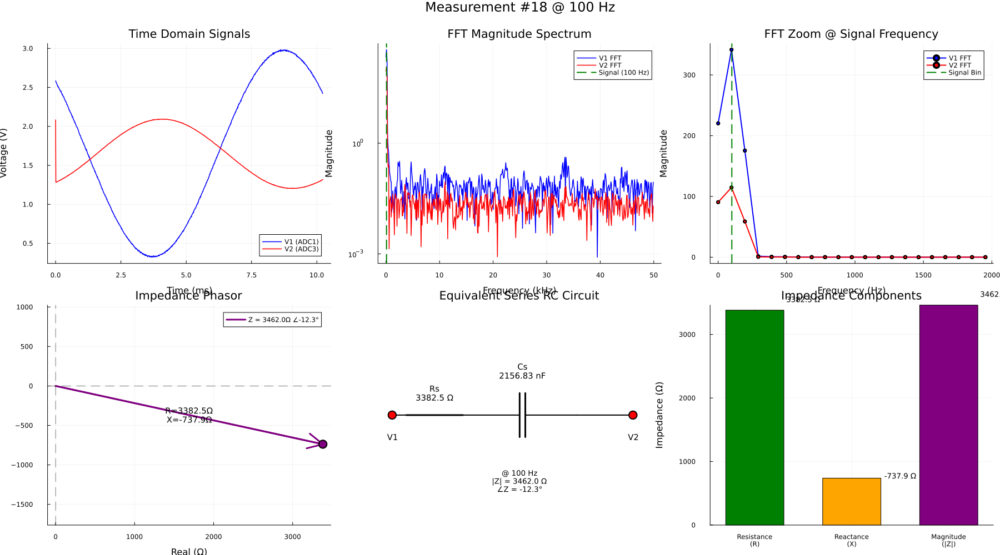

Results sent to STM32 [Measurement #18]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.1443, 1.1484, 1.1524, 1.1701, 1.1701, 1.183, 1.1903, 1.1895, 1.2064, 1.2007]
First 10 ADC3 samples (V): [1.3184, 1.8994, 1.893, 1.8954, 1.8914, 1.8897, 1.8897, 1.8841, 1.8833, 1.8801]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [19/30] |Z|=3466.581 Ω (Mean=3451.593, Std=8.951)
  V1: 0.001071 V @ -108.5°
  V2: 0.00036 V @ 58.83°
  |Z|: 3466.581 Ω, ∠Z: -12.67°
  Z = 3382.225 + -760.092j Ω

  Circuit Parameters:
    Cp = 0.101 µF
    Rp = 3553.04 Ω


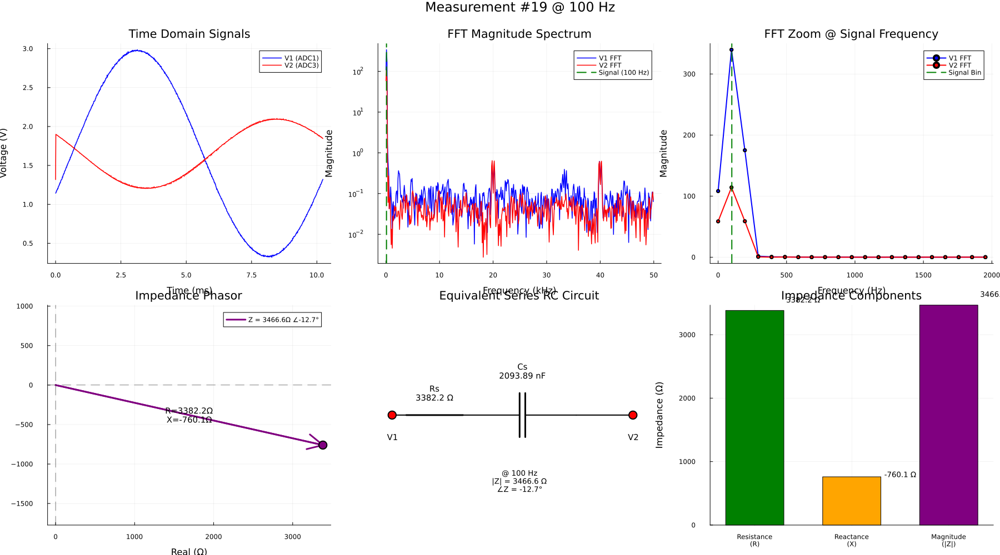

Results sent to STM32 [Measurement #19]

Received 4106 bytes
freq_out = 100 Hz, fsampling = 100000 Hz
 Parsed 1024 samples per channel.
First 10 ADC1 samples (V): [1.4514, 1.4433, 1.4368, 1.4264, 1.4167, 1.4151, 1.4054, 1.399, 1.3885, 1.3788]
First 10 ADC3 samples (V): [1.8454, 1.6246, 1.6278, 1.6343, 1.6327, 1.6359, 1.6383, 1.6407, 1.648, 1.6448]
Processing measurement:
  Signal frequency: 100 Hz
  FFT bin: 1
  [20/30] |Z|=3447.59 Ω (Mean=3451.393, Std=8.759)
  V1: 0.00107 V @ 103.19°
  V2: 0.000358 V @ -89.22°
  |Z|: 3447.59 Ω, ∠Z: -12.41°
  Z = 3367.01 + -741.025j Ω

  Circuit Parameters:
    Cp = 0.099 µF
    Rp = 3530.1 Ω


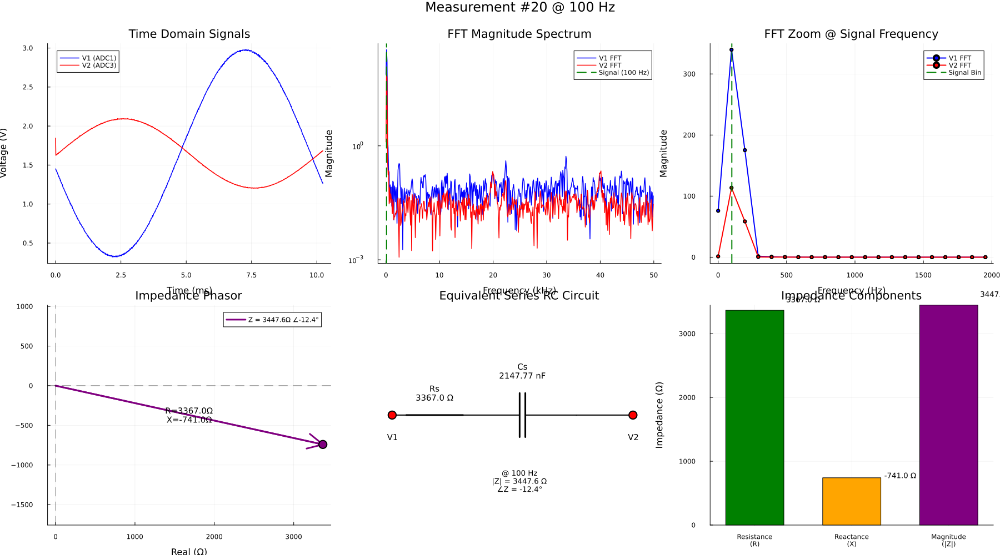

Results sent to STM32 [Measurement #20]


Completed 20 measurements
Serial port closed


In [53]:
 main(20) 